## Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [3]:
import os
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

dog.jpg exists


In [4]:
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [5]:
import torchvision
img = torchvision.io.read_image("dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


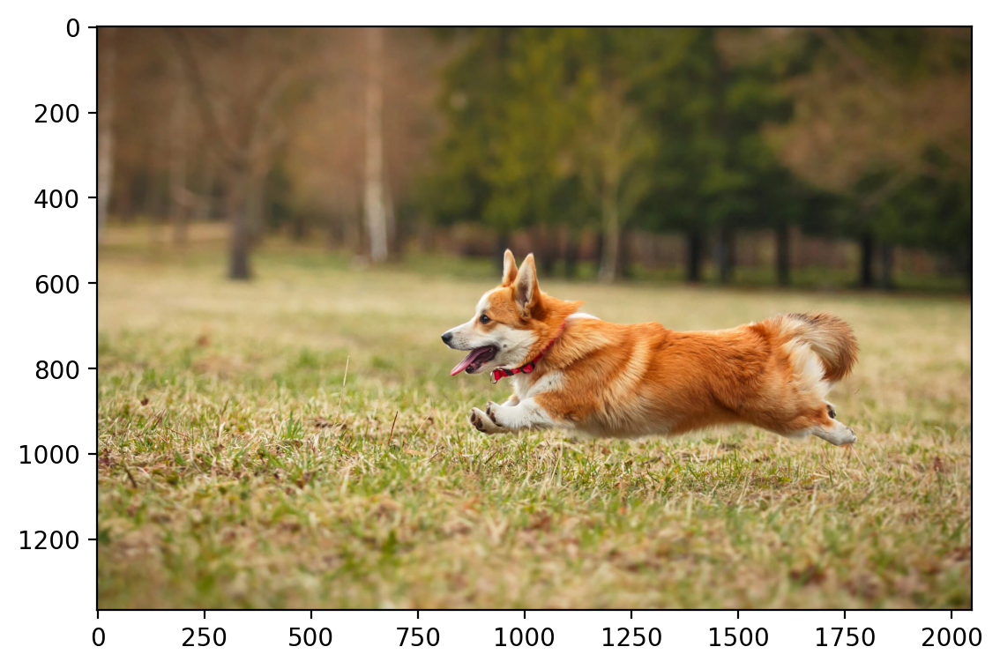

In [6]:
from einops import rearrange
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())

### Preprocessing

In [7]:
from sklearn import preprocessing

scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
scaler_img

MinMaxScaler()

In [8]:
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled.shape

img_scaled = torch.tensor(img_scaled)

In [9]:
img_scaled = img_scaled.to(device)
img_scaled

tensor([[[0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         ...,
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3765, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3804, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3843, 0.3804, 0.3804]],

        [[0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         ...,
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3176, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3216, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3255, 0.3216, 0.3216]],

        [[0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.

In [10]:
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 600, 800, 300, 300)
crop.shape

torch.Size([3, 300, 300])

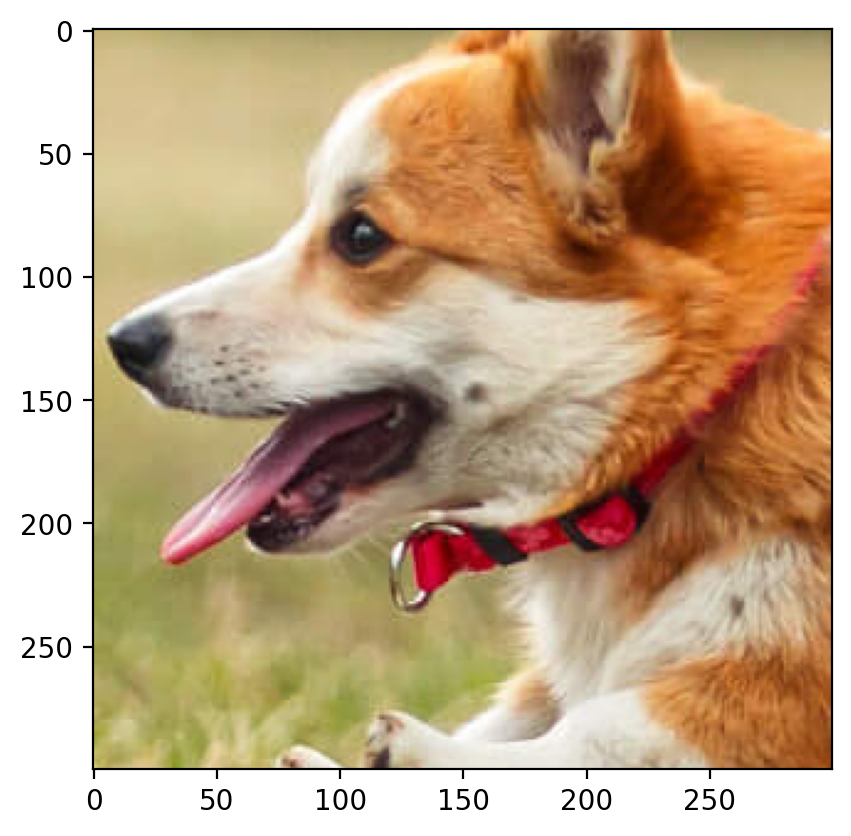

In [11]:
plt.imshow(rearrange(crop, 'c h w -> h w c').numpy())

### Masking

In [12]:
def mask_image(img, prop):
    img_copy = img.clone()
    masks = []
    for c in range(img.shape[0]):
        mask = torch.rand(img[c].shape) < prop
        img_copy[c][mask] = float('nan')
        masks.append(mask)
    return img_copy, masks

In [13]:
masked_img = mask_image(crop, 0.2)

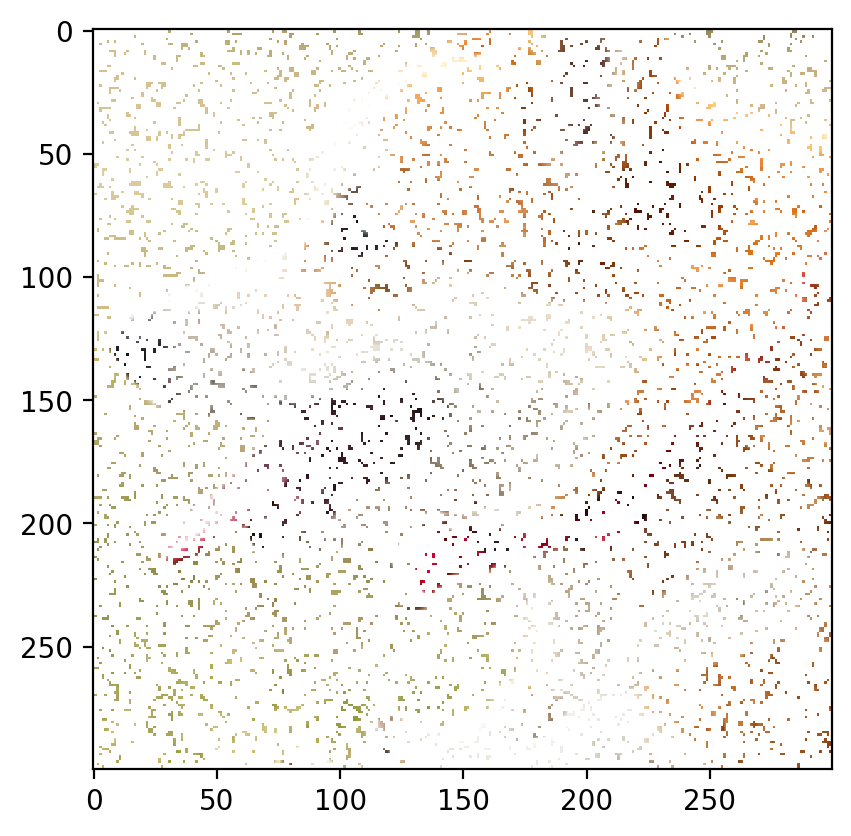

In [14]:
plt.imshow(rearrange(masked_img[0], 'c h w -> h w c').numpy())

### Matrix Factorization

In [15]:
def factorize(A, k, device=torch.device("cpu")):
    """Factorize the RGB matrix A into W and H for each channel
    A: input matrix of size (n_channels, n_users, n_movies)
    k: number of latent features
    
    Returns W and H for each channel
    W: list of matrices for each channel of size (n_users, k)
    H: list of matrices for each channel of size (k, n_movies)
    """
    A = A.to(device)
    W_list = []
    H_list = []
    final_losses = []
    
    for c in range(A.shape[0]):
        W = torch.randn(A.shape[1], k, requires_grad=True, device=device)
        H = torch.randn(k, A.shape[2], requires_grad=True, device=device)
        
        optimizer = optim.Adam([W, H], lr=0.01)
        mask = ~torch.isnan(A[c])

        for i in range(1000):
            diff_matrix = torch.mm(W, H) - A[c]
            diff_vector = diff_matrix[mask]
            loss = torch.norm(diff_vector)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        
        W_list.append(W)
        H_list.append(H)
        final_losses.append(loss.item())
    
    return W_list, H_list, final_losses

In [16]:
W_list, H_list, loss = factorize(masked_img[0], 50, device=device)

In [17]:
loss

[10.783739227864912, 11.433583439531711, 10.768221401507674]

#### Reconstruction

Text(0.5, 1.0, 'Original Image')

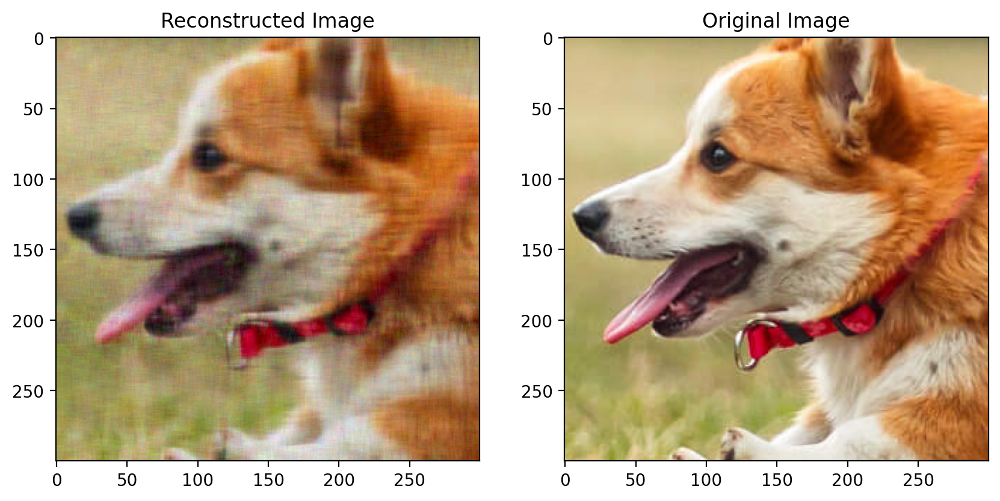

In [18]:
reconstructed_img = []

for W, H in zip(W_list, H_list):
    channel_reconstructed = torch.mm(W, H).cpu().detach().numpy()
    reconstructed_img.append(channel_reconstructed)

reconstructed_img = np.stack(reconstructed_img, axis=-1)
reconstructed_img = np.nan_to_num(reconstructed_img, nan=0.0)
reconstructed_img = np.clip(reconstructed_img, 0, None)

max_val = reconstructed_img.max()
if max_val > 0:
    reconstructed_img /= max_val
reconstructed_img *= 255
reconstructed_img = reconstructed_img.astype(np.uint8)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(reconstructed_img)
ax[0].set_title('Reconstructed Image')
ax[1].imshow(rearrange(crop, 'c h w -> h w c').numpy())
ax[1].set_title('Original Image')

#### RMSE and PSNR

In [19]:
import torch
import torch.nn.functional as F

ground_truth = crop.permute(1,2,0)
final_image = torch.tensor(reconstructed_img).permute(2, 0, 1).float() / 255.0
ground_truth = torch.tensor(ground_truth).clone().detach().permute(2, 0, 1).float() / 255.0

rmse_list = []
psnr_list = []

for channel in range(final_image.shape[0]):
    mse = F.mse_loss(final_image[channel], ground_truth[channel])
    rmse = torch.sqrt(mse)
    rmse_list.append(rmse.item())

    max_pixel_value = 1.0
    psnr = 10 * torch.log10((max_pixel_value**2) / mse) if mse.item() > 0 else float('inf')
    psnr_list.append(psnr.item())

for i, (rmse, psnr) in enumerate(zip(rmse_list, psnr_list)):
    print(f"Channel {i}: RMSE = {rmse}, PSNR = {psnr}")

overall_rmse = np.mean(rmse_list)
overall_psnr = np.mean(psnr_list)
print(f"Overall RMSE: {overall_rmse}, Overall PSNR: {overall_psnr}")

Channel 0: RMSE = 0.6627257466316223, PSNR = 3.5733237266540527
Channel 1: RMSE = 0.5502476692199707, PSNR = 5.188835144042969
Channel 2: RMSE = 0.41577470302581787, PSNR = 7.622838973999023
Overall RMSE: 0.5429160396258036, Overall PSNR: 5.461665948232015


C:\Users\aashm\AppData\Local\Temp\ipykernel_9584\1763882782.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  ground_truth = torch.tensor(ground_truth).clone().detach().permute(2, 0, 1).float() / 255.0


## Q1 Answer

In [20]:
def plot_image_completion(prop=0.1, factors=50):
    masked_img, mask = mask_image(crop, prop)
    W_list, H_list, loss = factorize(masked_img, factors, device=device)
    
    fig, ax = plt.subplots(1, 3, figsize=(10, 5))
    reconstructed_img = []

    for W, H in zip(W_list, H_list):
        channel_reconstructed = torch.mm(W, H).cpu().detach().numpy()
        reconstructed_img.append(channel_reconstructed)

    reconstructed_img = np.stack(reconstructed_img, axis=-1)
    reconstructed_img = np.nan_to_num(reconstructed_img, nan=0.0)
    reconstructed_img = np.clip(reconstructed_img, 0, None)

    max_val = reconstructed_img.max()
    if max_val > 0:
        reconstructed_img /= max_val
    reconstructed_img *= 255
    reconstructed_img = reconstructed_img.astype(np.uint8)

    ax[0].imshow(rearrange(masked_img, 'c h w -> h w c').numpy())
    ax[0].set_title("Masked image")
    ax[1].imshow(reconstructed_img)
    ax[1].set_title("Reconstructed image")
    ax[2].imshow(rearrange(crop, 'c h w -> h w c').numpy())
    ax[2].set_title("Original image")

    ground_truth = crop.permute(1,2,0)
    final_image = torch.tensor(reconstructed_img).permute(2, 0, 1).float() / 255.0
    ground_truth = torch.tensor(ground_truth).clone().detach().permute(2, 0, 1).float() / 255.0

    rmse_list = []
    psnr_list = []

    for channel in range(final_image.shape[0]):
        mse = F.mse_loss(final_image[channel], ground_truth[channel])
        rmse = torch.sqrt(mse)
        rmse_list.append(rmse.item())

        max_pixel_value = 1.0
        psnr = 10 * torch.log10((max_pixel_value**2) / mse) if mse.item() > 0 else float('inf')
        psnr_list.append(psnr.item())

    overall_rmse = np.mean(rmse_list)
    overall_psnr = np.mean(psnr_list)
    print(f"Overall RMSE: {overall_rmse}, Overall PSNR: {overall_psnr}")

interactive(children=(FloatSlider(value=0.3, description='prop', max=0.9, min=0.01, step=0.01), IntSlider(valu…

<function __main__.plot_image_completion(prop=0.1, factors=50)>

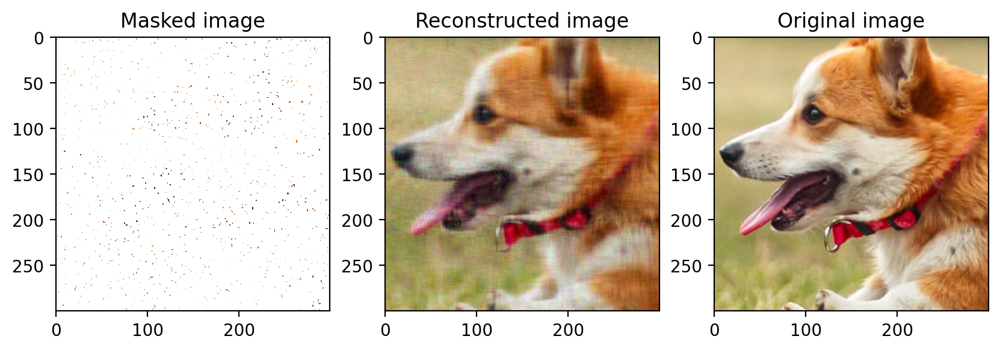

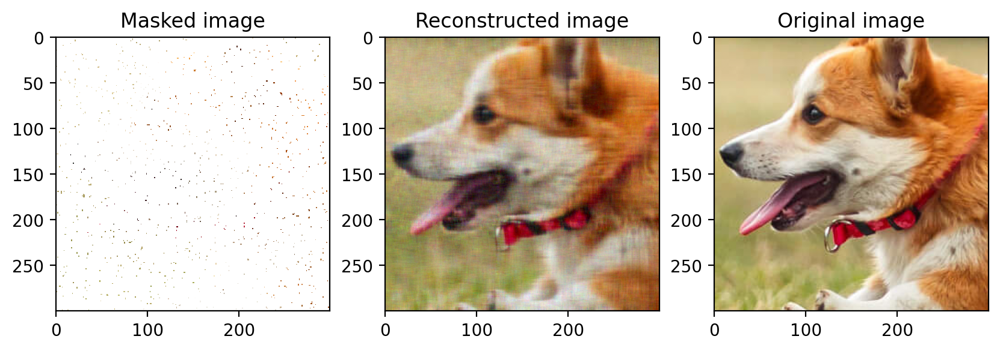

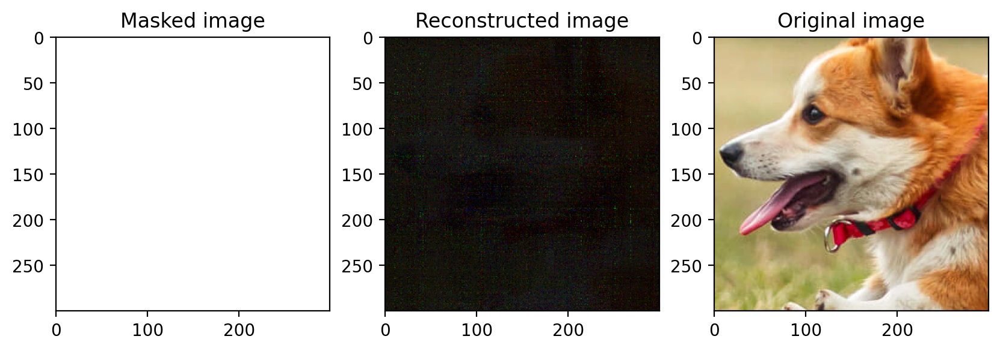

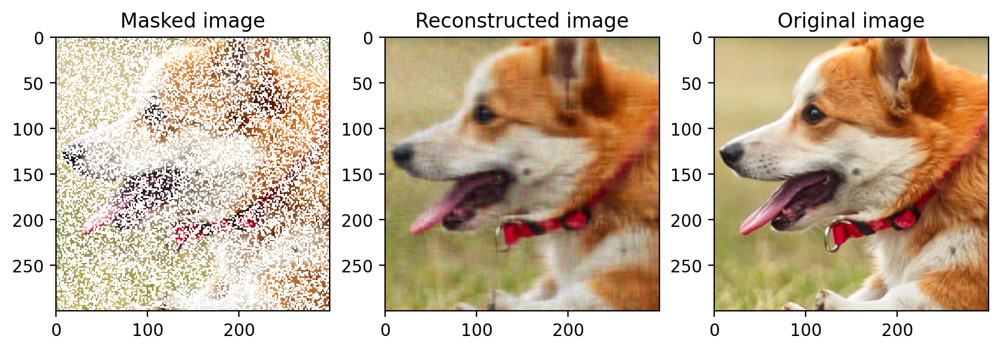

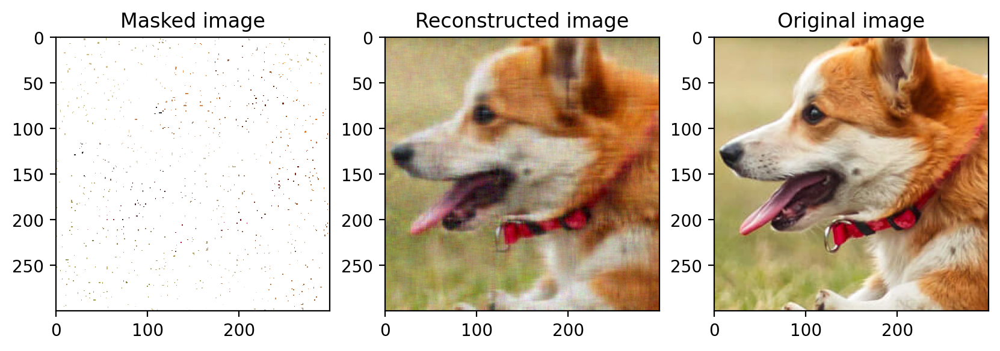

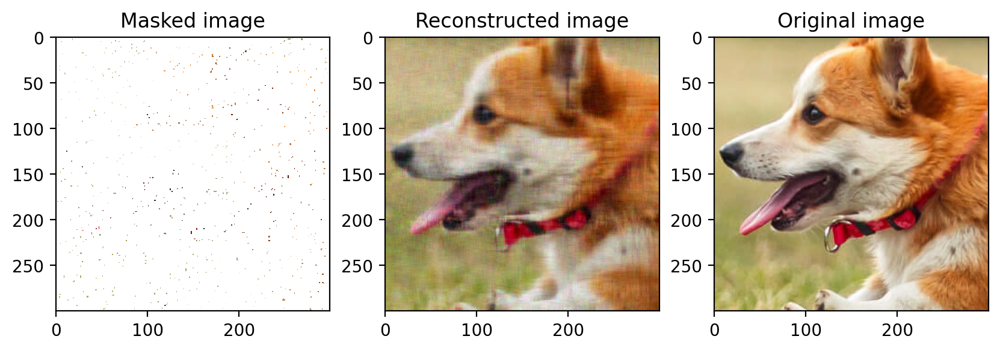

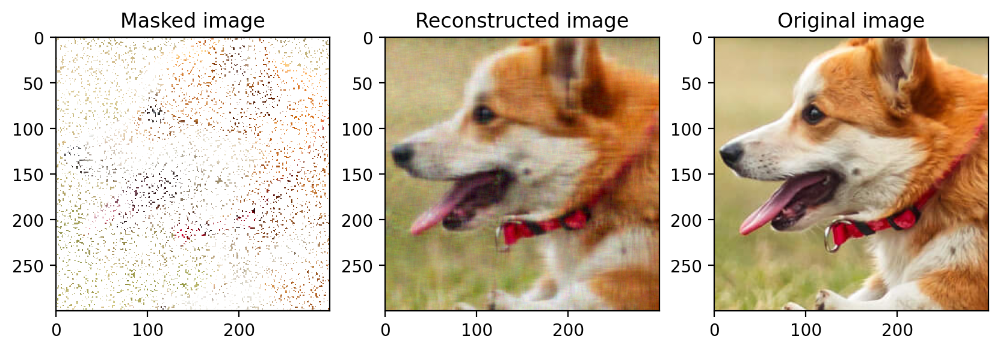

In [21]:
from ipywidgets import interact, widgets

interact(plot_image_completion, prop=widgets.FloatSlider(min=0.01, max=0.9, step=0.01, value=0.3), factors=widgets.IntSlider(min=1, max=150, step=1, value=50))

## Q2

### Patch Removal

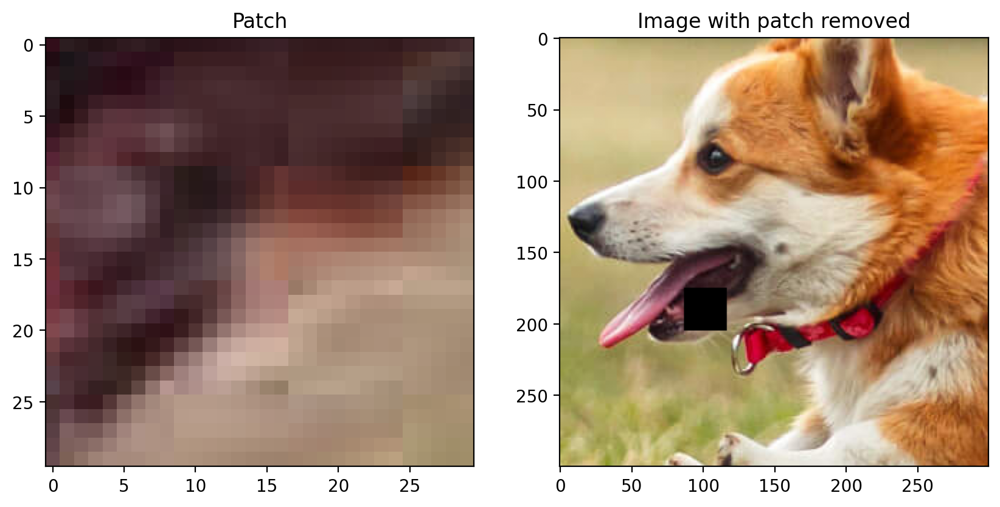

In [22]:
import random
import torchvision.transforms.functional as TF

height, width = crop.shape[1], crop.shape[2]
T = random.randint(0, height - 30)
L = random.randint(0, width - 30)

image_copy = crop.clone()
patch = TF.crop(crop, T, L, 30, 30)

image_copy[:, T:T+30, L:L+30] = 0

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].imshow(patch.permute(1, 2, 0).numpy())
ax[0].set_title("Patch")
ax[1].imshow(image_copy.permute(1, 2, 0).numpy())
ax[1].set_title("Image with patch removed")
plt.show()

In [23]:
def factorize_m(A, k, device=torch.device("cpu")):
    """Factorize the RGB matrix A into W and H for each channel.
    A: input matrix of size (n_channels, height, width)
    k: number of latent features
    
    Returns W and H for each channel
    """
    A = A.to(device)
    W_list = []
    H_list = []
    final_losses = []
    
    for c in range(A.shape[0]):  # Iterate over channels (RGB)
        W = torch.randn(A.shape[1], k, requires_grad=True, device=device)  # For height
        H = torch.randn(k, A.shape[2], requires_grad=True, device=device)  # For width
        
        optimizer = optim.Adam([W, H], lr=0.01)

        # Create a mask for non-zero elements (i.e., non-missing parts)
        mask = (A[c] != 0).float()

        for i in range(1000):
            # Only compute the loss for the observed entries
            diff_matrix = torch.mm(W, H) * mask - A[c] * mask
            loss = torch.norm(diff_matrix)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        
        W_list.append(W)
        H_list.append(H)
        final_losses.append(loss.item())
    
    return W_list, H_list, final_losses


In [24]:
W_list, H_list, loss = factorize_m(image_copy, 150, device=device)

In [26]:
loss

[8.02417665794099, 8.000962704968597, 8.053847092329613]

Text(0.5, 1.0, 'Original Image')

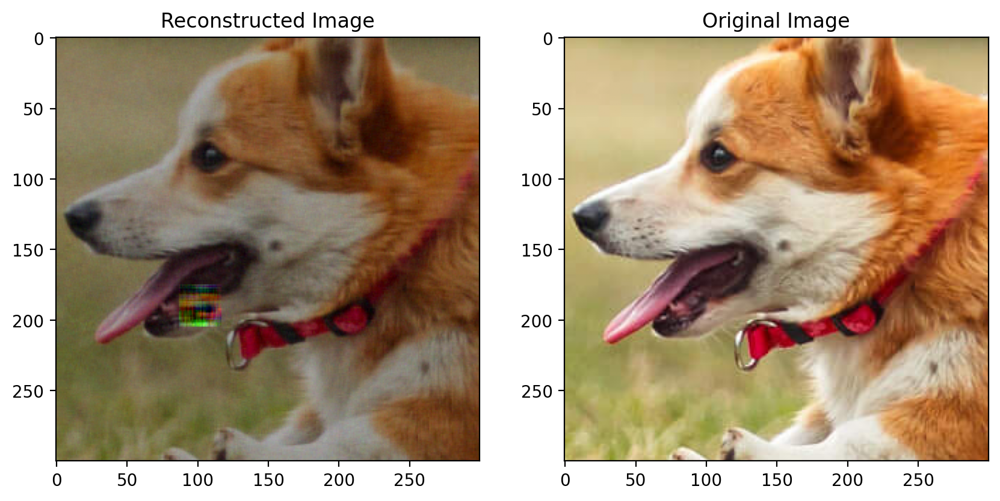

In [27]:
reconstructed_img = []

for W, H in zip(W_list, H_list):
    channel_reconstructed = torch.mm(W, H).cpu().detach().numpy()
    reconstructed_img.append(channel_reconstructed)

reconstructed_img = np.stack(reconstructed_img, axis=-1)
reconstructed_img = np.nan_to_num(reconstructed_img, nan=0.0)
reconstructed_img = np.clip(reconstructed_img, 0, None)

max_val = reconstructed_img.max()
if max_val > 0:
    reconstructed_img /= max_val
reconstructed_img *= 255
reconstructed_img = reconstructed_img.astype(np.uint8)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(reconstructed_img)
ax[0].set_title('Reconstructed Image')
ax[1].imshow(rearrange(crop, 'c h w -> h w c').numpy())
ax[1].set_title('Original Image')

In [28]:
ground_truth = crop.permute(1,2,0)
final_image = torch.tensor(reconstructed_img).permute(2, 0, 1).float() / 255.0
ground_truth = torch.tensor(ground_truth).clone().detach().permute(2, 0, 1).float() / 255.0

rmse_list = []
psnr_list = []

for channel in range(final_image.shape[0]):
    mse = F.mse_loss(final_image[channel], ground_truth[channel])
    rmse = torch.sqrt(mse)
    rmse_list.append(rmse.item())

    max_pixel_value = 1.0
    psnr = 10 * torch.log10((max_pixel_value**2) / mse) if mse.item() > 0 else float('inf')
    psnr_list.append(psnr.item())

overall_rmse = np.mean(rmse_list)
overall_psnr = np.mean(psnr_list)
print(f"Overall RMSE: {overall_rmse}, Overall PSNR: {overall_psnr}")

Overall RMSE: 0.38371071219444275, Overall PSNR: 8.476849873860678


C:\Users\aashm\AppData\Local\Temp\ipykernel_9584\2053242886.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  ground_truth = torch.tensor(ground_truth).clone().detach().permute(2, 0, 1).float() / 255.0


## Linear Model

In [29]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)
        
    def forward(self, x):
        return self.linear(x)

In [30]:
net = LinearModel(2, 3)
net.to(device)

LinearModel(
  (linear): Linear(in_features=2, out_features=3, bias=True)
)

In [32]:
def train(net, lr, X, Y, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)

    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = net(X)   
        loss = criterion(outputs, Y)
        loss.backward()
        optimizer.step()
        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")

    return loss.item()

In [33]:
input_size = image_copy[:, T:T+30, L:L+30].numel()
output_size = patch.numel()

X = image_copy[:, T:T+30, L:L+30].flatten().unsqueeze(0).to(device)
Y = patch.flatten().unsqueeze(0).to(device)

X = X.float()
Y = Y.float()

Epoch 0 loss: 0.165879
Epoch 100 loss: 0.000244


Text(0.5, 1.0, 'Original Image')

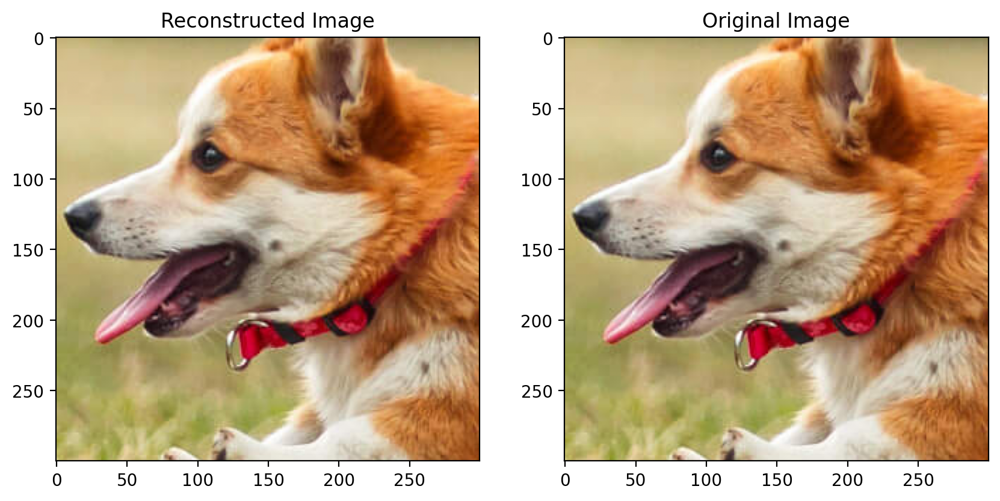

In [34]:
model = LinearModel(input_size, output_size).to(device)
loss = train(model, lr=0.01, X=X, Y=Y, epochs=200)

with torch.no_grad():
    reconstructed_patch = model(X).view_as(patch).cpu()

reconstructed_image = image_copy.clone()
reconstructed_image[:, T:T+30, L:L+30] = reconstructed_patch

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(reconstructed_image.permute(1, 2, 0).numpy())
ax[0].set_title('Reconstructed Image')
ax[1].imshow(rearrange(crop, 'c h w -> h w c').numpy())
ax[1].set_title('Original Image')

In [35]:
rmse = torch.sqrt(torch.tensor(loss)).item()
psnr = 20 * np.log10(255 / rmse) if rmse != 0 else float('inf')

print(f"RMSE: {rmse:.4f}")
print(f"PSNR: {psnr:.2f} dB")

RMSE: 0.0001
PSNR: 129.90 dB


## RFF Features Extraction

In [36]:
def create_rff_features(X, num_features, sigma):
    from sklearn.kernel_approximation import RBFSampler
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2))
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device)

In [37]:
rff_features = 100
sigma = 0.1

In [38]:
X_rff = create_rff_features(X, rff_features, sigma)

Epoch 0 loss: 0.171315
Epoch 100 loss: 0.000002
Epoch 200 loss: 0.000000
Epoch 300 loss: 0.000000
Epoch 400 loss: 0.000000
Epoch 500 loss: 0.000000
Epoch 600 loss: 0.000000
Epoch 700 loss: 0.000000
Epoch 800 loss: 0.000000
Epoch 900 loss: 0.000000


Text(0.5, 1.0, 'Original Image')

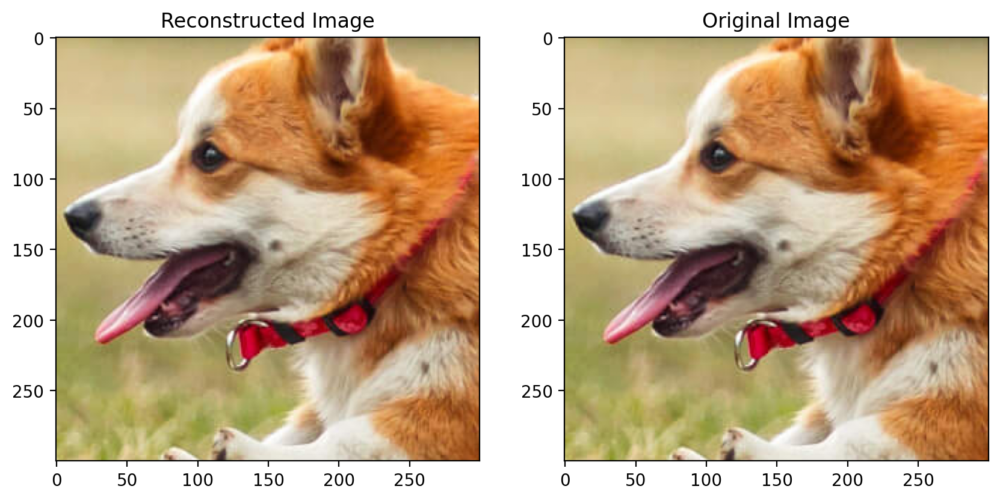

In [39]:
model = LinearModel(rff_features, output_size).to(device)
loss_rff = train(model, lr=0.01, X=X_rff, Y=Y, epochs=1000)

with torch.no_grad():
    reconstructed_patch = model(X_rff).view_as(patch).cpu()

reconstructed_image = image_copy.clone()
reconstructed_image[:, T:T+30, L:L+30] = reconstructed_patch

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(reconstructed_image.permute(1, 2, 0).numpy())
ax[0].set_title('Reconstructed Image')
ax[1].imshow(rearrange(crop, 'c h w -> h w c').numpy())
ax[1].set_title('Original Image')

In [40]:
rmse = torch.sqrt(torch.tensor(loss_rff)).item()
psnr = 20 * np.log10(255 / rmse) if rmse != 0 else float('inf')

print(f"RMSE: {rmse:.4f}")
print(f"PSNR: {psnr:.2f} dB")

RMSE: 0.0000
PSNR: 205.19 dB


RFF Feature Training performs better tha the regular Linear Model
While both of these are performing significantly better than the Matrix Factorization method


The Matrix Factorisation method does not work well when a continuous segment is removed.